# DARTS: Deceiving Autonomous Cars with Toxic Signs

---

Author: Chawin Sitawarin (<chawins@princeton.edu>)  

This is the main file which contains code used to run most of the experiments including physical adversarial examples generation and virtual as well as drive-by evaluation.

In [31]:
# Specify visible cuda device
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [32]:
%matplotlib inline

%reload_ext autoreload
%autoreload 2

import pickle
from parameters import *
from lib.utils import *
from lib.attacks import *
from lib.detector_utils import *
from lib.keras_utils import *
from lib.RandomTransform import *
from lib.OptCarlini import *
from lib.OptTransform import *
from lib.OptProjTran import *

In [33]:
# Build and load trained model
model = build_mltscl()
# model = build_cnn()
model.load_weights(WEIGTHS_PATH)

# Load dataset
x_train, y_train, x_val, y_val, x_test, y_test = load_dataset_GTSRB(
    n_channel=N_CHANNEL)

y_train = keras.utils.to_categorical(y_train, NUM_LABELS)
y_test = keras.utils.to_categorical(y_test, NUM_LABELS)
y_val = keras.utils.to_categorical(y_val, NUM_LABELS)

# Read sign names
signnames = read_csv("./input_data/signnames.csv").values[:, 1]

In [34]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
conv2d_7 (Conv2D)               (None, 32, 32, 32)   2432        input_3[0][0]                    
__________________________________________________________________________________________________
dropout_9 (Dropout)             (None, 32, 32, 32)   0           conv2d_7[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_11 (MaxPooling2D) (None, 16, 16, 32)   0           dropout_9[0][0]                  
__________________________________________________________________________________________________
conv2d_8 (

## Run Attacks: Adversarial Traffic Signs

In [35]:
SAMPLE_IMG_DIR = './images/Original_Traffic_Sign_samples/'
SAMPLE_LABEL = './images/Original_Traffic_Sign_samples/labels.txt'

Load samples 

In [36]:
# Load sample images and labels. Remove samples
del_id = [3, 8, 9, 10, 14]
x_smp, x_smp_full, y_smp, masks, masks_full = load_samples(
    SAMPLE_IMG_DIR, SAMPLE_LABEL)
x_smp = np.delete(x_smp, del_id, axis=0)
x_smp_full = np.delete(x_smp_full, del_id, axis=0)
y_smp = np.delete(y_smp, del_id, axis=0)
masks = np.delete(masks, del_id, axis=0)
masks_full = np.delete(masks_full, del_id, axis=0)

Specify target classes

In [49]:
# Target classes are chosen at random
y_target = np.array([3, 20, 42, 38,  1, 22, 24,  6, 13,  8, 29, 14, 41, 37,  7,
                     32, 19, 21,  9, 26])
y_target = keras.utils.to_categorical(y_target, NUM_LABELS)

Double-check that images are read and classified correctly. Also make sure that masks are generated appropriately.

0
Speed limit (30km/h)  Speed limit (30km/h)


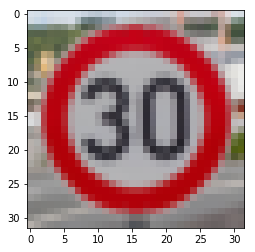

1
No entry  No entry


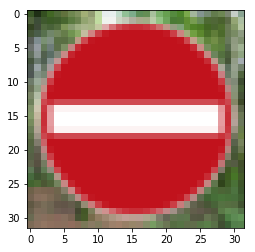

2
Turn right ahead  Turn right ahead


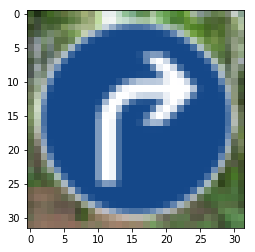

3
No vechiles  No vechiles


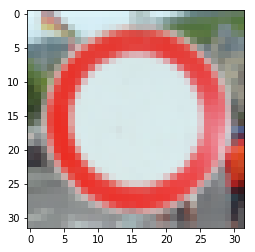

4
Speed limit (60km/h)  Speed limit (60km/h)


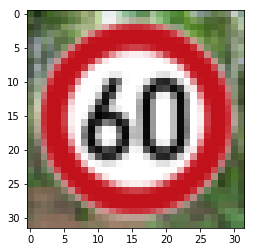

5
Keep left  Keep left


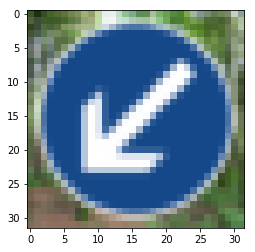

6
Vechiles over 3.5 metric tons prohibited  Vechiles over 3.5 metric tons prohibited


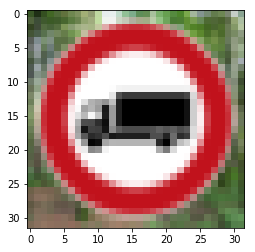

7
Speed limit (100km/h)  Speed limit (100km/h)


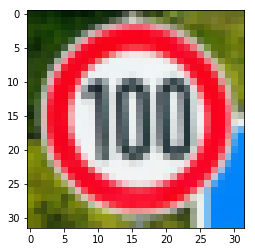

8
No passing  No passing


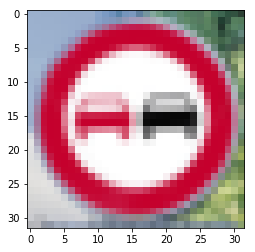

9
Stop  Stop


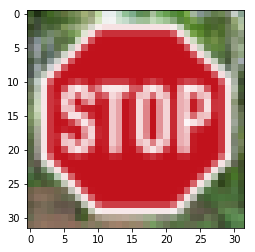

10
Roundabout mandatory  Roundabout mandatory


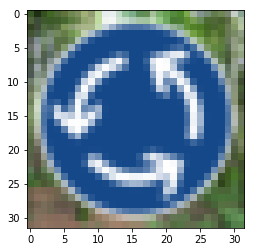

11
No passing for vechiles over 3.5 metric tons  No passing for vechiles over 3.5 metric tons


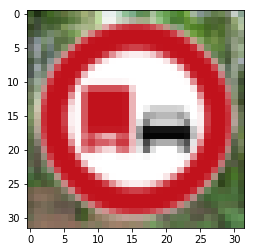

12
General caution  General caution


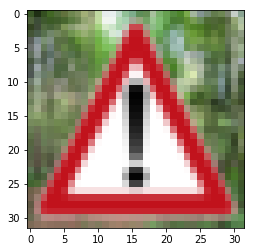

13
Right-of-way at the next intersection  Right-of-way at the next intersection


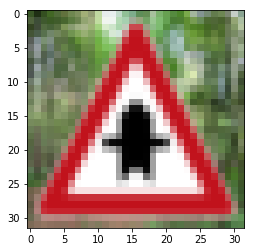

14
Speed limit (50km/h)  Speed limit (50km/h)


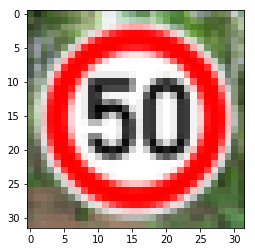

15
Dangerous curve to the right  Dangerous curve to the right


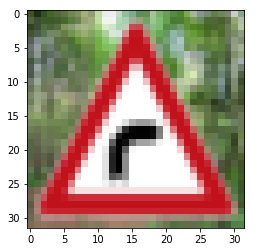

16
End of all speed and passing limits  End of all speed and passing limits


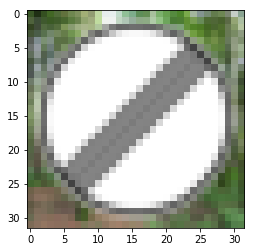

17
Speed limit (120km/h)  Speed limit (120km/h)


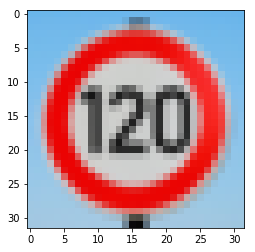

18
Speed limit (80km/h)  Speed limit (80km/h)


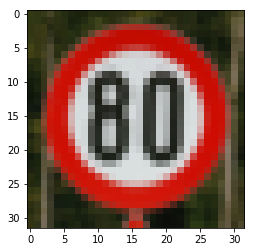

19
Ahead only  Ahead only


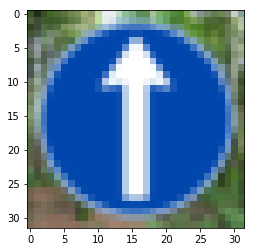

20
Bicycles crossing  Bicycles crossing


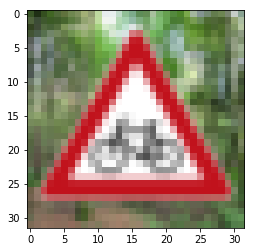

21
End of no passing  End of no passing


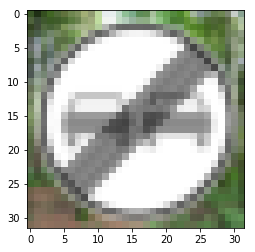

In [38]:
for i, im in enumerate(x_smp):
    print(i)
    print(signnames[predict(model, im)] + "  " + signnames[np.argmax(y_smp[i])])
    plt.imshow(im)
    plt.show()

Utility method for quick check on jupyter notebook

In [39]:
def test_tran(im_full, model):
    """Get predicted labels from a 10 randomly transformed im_full"""
    
    rnd_transform = RandomTransform(p=1.0, intensity=0.3)
    out = []
    
    for i in range(10):
        tmp = rnd_transform.transform(im_full)
        tmp = random_brightness(tmp, delta=0.3)
        resized_im = resize(tmp, (HEIGHT, WIDTH), interp="bilinear")
        out.append(signnames[predict(model, resized_im)])
        
    print(out)
    return out

What random transformation and enhancement look like

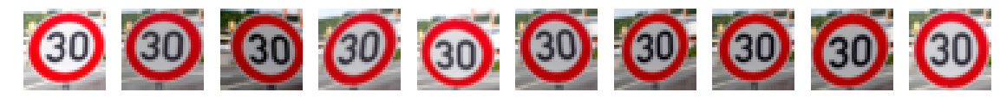

In [40]:
fig, ax = plt.subplots(nrows=1, ncols=10, figsize=(20,5))

seed = 1111
rnd_transform = RandomTransform(seed=seed, p=1.0, intensity=0.3)

for col in ax:
    tmp = rnd_transform.transform(x_smp_full[0])
    tmp = random_brightness(tmp, delta=0.3)
    im_t = random_resize(tmp)
    col.imshow(im_t)
    col.axis("off")

### OptProjTran

`OptProjTran` is our main attack function. Usage example is the following.

In [ ]:
# Get random sampling sizes
sp_size = np.repeat(np.random.randint(20, 600, 128), 2).reshape(128, 2)

opt = OptProjTran(model, c=0.2, lr=0.02, target=True, use_bound=False,
                  init_scl=0.1, loss_op=0, var_change=True, use_mask=True,
                  k=100, batch_size=128, decay=False, p_norm="1",
                  l=30, sp_size=sp_size, rnd_tran=INT_TRN,
                  rnd_bri=DELTA_BRI, c_smooth=0)

outputs = []
norms = []

for i, x in enumerate(x_smp):
    print(i)
    x_adv, norm = opt.optimize(x, y_target[i], n_step=2000, prog=True, mask=masks[i])
    outputs.append(x_adv)
    norms.append(norm)

### Iterative method with transformation

(not used in paper)  
`iter_transform` is a gradient descent method that incorporates masks and random transformation of the input sample.

In [ ]:
outputs = []
losses = []

for i, x in enumerate(x_ben):
    print(i)
    x_adv, loss = iter_transform(model, x, y_target[i], norm="inf", n_step=200, 
                                 step_size=0.001, target=True, mask=masks_ben[i], 
                                 batch_size=128)
    outputs.append(x_adv)
    losses.append(loss)

### Load generated samples for virtual testing

In [43]:
# Code snippet to load outputs generated from OptProjTran

SAVE_DIR = "./adv_signs/Adversarial_Traffic_Signs/"
alg = "opt_proj"
ind = "5"

outputs = []
norms = []
for i in range(len(y_target)):
    outputs.append(pickle.load(open("{}outputs_{}_{}_{}.p".format(
        SAVE_DIR, alg, ind, i), "rb")))
    norms.extend(pickle.load(open("{}norms_{}_{}_{}.p".format(
        SAVE_DIR, alg, ind, i), "rb")))

In [51]:
# Rearrange samples for evaluation function
x_adv = []
y_tg = []
y_orig = []
x_orig = []
x_orig_full = []

for i, o in enumerate(outputs):
    j = 0
    for x in o:
        if np.argmax(y_smp[i]) == np.argmax(y_target[j]):
            j += 1
        x_adv.append(x)
        y_tg.append(y_target[j])
        y_orig.append(y_smp[i])
        x_orig.append(x_smp[i])
        x_orig_full.append(x_smp_full[i])
        j += 1

x_adv = np.array(x_adv)
y_tg = np.array(y_tg)
y_orig = np.array(y_orig)
x_orig = np.array(x_orig)
x_orig_full = np.array(x_orig_full)

# Start evaluation
suc, c_adv, c_orig = evaluate_adv(model, x_adv, y_tg, x_orig, 
    y_smp=y_orig, target=True, x_smp_full=x_orig_full, tran=False)

print(np.mean(norms))
print(suc)

37.70602
0.5433673469387755


### Create pre-print physical adversarial signs

In [52]:
# Resize perturbation and add to the original image

outputs_full = []

for i, o in enumerate(outputs):
    outs_full = []
    for j, x in enumerate(o):
        ptb = x - x_smp[i]
        ptb = cv2.resize(ptb, (x_smp_full[i].shape[1], x_smp_full[i].shape[0]), 
                         interpolation=cv2.INTER_LINEAR)
        out_full = x_smp_full[i] + ptb
        out_full = np.clip(out_full, 0, 1)
        outs_full.append(out_full)
    outputs_full.append(outs_full)

`outputs_full` are adversarial examples ready for printing for physical attacks

Sample: 0, Label: 0
Classified label: Speed limit (60km/h)  <------- Target: Speed limit (60km/h)
30.0
['Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)']


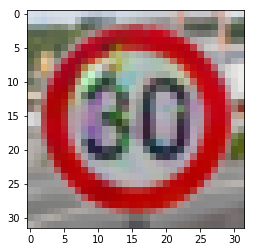

Sample: 0, Label: 1
Classified label: Dangerous curve to the right  <------- Target: Dangerous curve to the right
30.0
['Dangerous curve to the right', 'Dangerous curve to the right', 'Speed limit (20km/h)', 'Dangerous curve to the right', 'Dangerous curve to the right', 'Dangerous curve to the right', 'Keep left', 'Dangerous curve to the right', 'Dangerous curve to the right', 'Dangerous curve to the right']


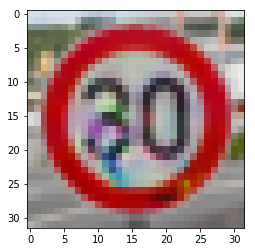

Sample: 0, Label: 2
Classified label: Speed limit (20km/h)  <------- Target: End of no passing by vechiles over 3.5 metric tons
30.0
['Speed limit (20km/h)', 'End of no passing', 'Speed limit (20km/h)', 'Stop', 'Yield', 'Speed limit (20km/h)', 'Stop', 'Speed limit (30km/h)', 'Stop', 'Vechiles over 3.5 metric tons prohibited']


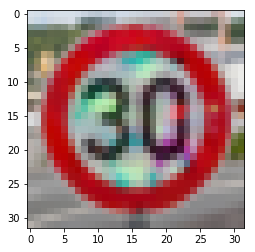

Sample: 0, Label: 3
Classified label: Keep right  <------- Target: Keep right
30.0
['Keep right', 'Keep right', 'Keep right', 'Keep right', 'Keep right', 'Keep right', 'Keep right', 'Keep right', 'Keep right', 'Keep right']


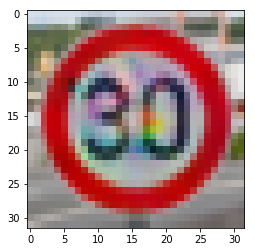

Sample: 0, Label: 5
Classified label: Bumpy road  <------- Target: Bumpy road
30.0
['General caution', 'Speed limit (60km/h)', 'Speed limit (20km/h)', 'Speed limit (20km/h)', 'Speed limit (20km/h)', 'Speed limit (60km/h)', 'Bumpy road', 'Bumpy road', 'General caution', 'Speed limit (20km/h)']


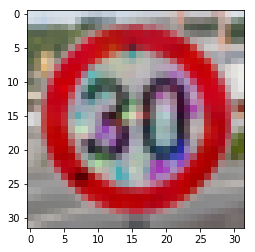

Sample: 0, Label: 6
Classified label: Road narrows on the right  <------- Target: Road narrows on the right
30.0
['Road narrows on the right', 'Speed limit (30km/h)', 'Road narrows on the right', 'Road narrows on the right', 'Road narrows on the right', 'Road narrows on the right', 'Road narrows on the right', 'Road narrows on the right', 'Road narrows on the right', 'Road narrows on the right']


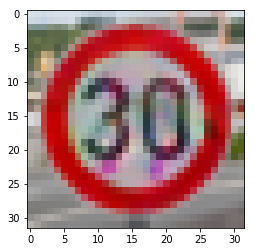

Sample: 0, Label: 7
Classified label: End of speed limit (80km/h)  <------- Target: End of speed limit (80km/h)
30.0
['End of speed limit (80km/h)', 'End of speed limit (80km/h)', 'End of speed limit (80km/h)', 'End of speed limit (80km/h)', 'End of speed limit (80km/h)', 'End of speed limit (80km/h)', 'End of speed limit (80km/h)', 'End of speed limit (80km/h)', 'Speed limit (30km/h)', 'End of speed limit (80km/h)']


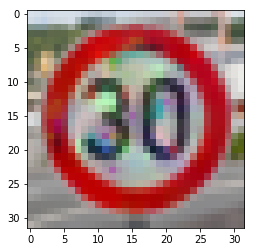

Sample: 0, Label: 8
Classified label: Yield  <------- Target: Yield
30.0
['Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'Yield']


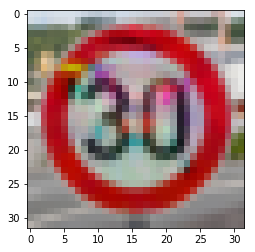

Sample: 0, Label: 9
Classified label: Speed limit (120km/h)  <------- Target: Speed limit (120km/h)
30.0
['Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (120km/h)', 'Speed limit (120km/h)']


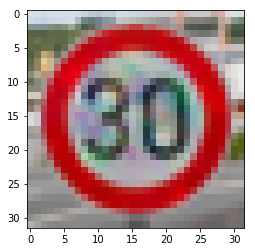

Sample: 0, Label: 10
Classified label: Bicycles crossing  <------- Target: Bicycles crossing
30.0
['Bicycles crossing', 'Bicycles crossing', 'Bicycles crossing', 'Bicycles crossing', 'Bicycles crossing', 'Bicycles crossing', 'Bicycles crossing', 'Bicycles crossing', 'Bicycles crossing', 'Speed limit (30km/h)']


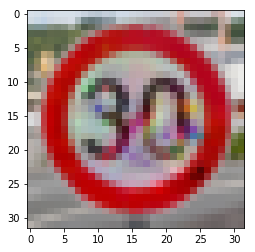

Sample: 0, Label: 11
Classified label: Stop  <------- Target: Stop
30.0
['Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop']


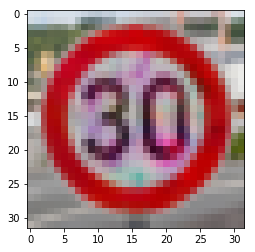

Sample: 0, Label: 12
Classified label: Yield  <------- Target: End of no passing
30.0
['Yield', 'Vechiles over 3.5 metric tons prohibited', 'Yield', 'Yield', 'Vechiles over 3.5 metric tons prohibited', 'End of no passing', 'Speed limit (30km/h)', 'Speed limit (20km/h)', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited']


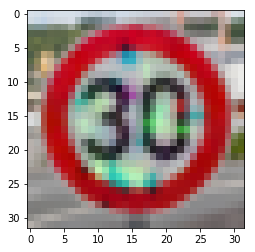

Sample: 0, Label: 13
Classified label: Go straight or left  <------- Target: Go straight or left
30.0
['Go straight or left', 'Go straight or left', 'Go straight or left', 'Go straight or left', 'Go straight or left', 'Go straight or left', 'Go straight or left', 'Go straight or left', 'Go straight or left', 'Go straight or left']


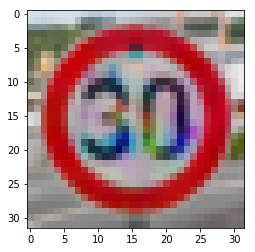

Sample: 0, Label: 14
Classified label: Speed limit (100km/h)  <------- Target: Speed limit (100km/h)
30.0
['Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)', 'Speed limit (100km/h)']


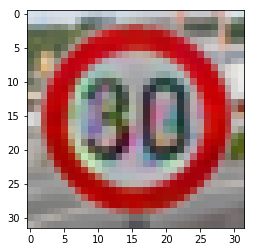

Sample: 0, Label: 15
Classified label: End of all speed and passing limits  <------- Target: End of all speed and passing limits
30.0
['End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits', 'End of all speed and passing limits']


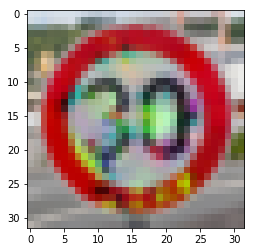

Sample: 0, Label: 16
Classified label: Dangerous curve to the left  <------- Target: Dangerous curve to the left
30.0
['Speed limit (30km/h)', 'Dangerous curve to the left', 'Speed limit (70km/h)', 'Dangerous curve to the left', 'Dangerous curve to the left', 'Dangerous curve to the left', 'Vechiles over 3.5 metric tons prohibited', 'Dangerous curve to the left', 'Dangerous curve to the left', 'Speed limit (30km/h)']


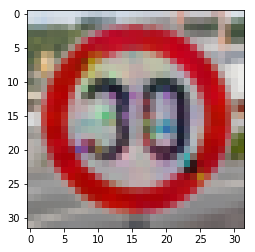

Sample: 0, Label: 17
Classified label: Double curve  <------- Target: Double curve
30.0
['Double curve', 'Double curve', 'Double curve', 'Double curve', 'Double curve', 'Double curve', 'Double curve', 'Double curve', 'Double curve', 'Double curve']


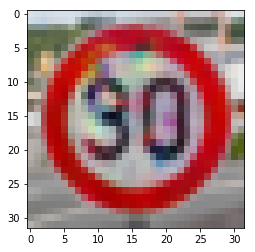

Sample: 0, Label: 18
Classified label: No passing  <------- Target: No passing
30.0
['No passing', 'No passing', 'No passing', 'No passing', 'No passing', 'No passing', 'No passing', 'No passing', 'No passing', 'No passing']


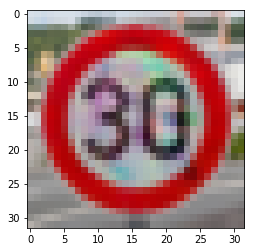

Sample: 0, Label: 19
Classified label: Traffic signals  <------- Target: Traffic signals
30.0
['Traffic signals', 'Traffic signals', 'Traffic signals', 'Traffic signals', 'Traffic signals', 'Traffic signals', 'Traffic signals', 'Traffic signals', 'Traffic signals', 'Traffic signals']


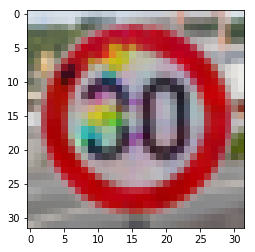

Sample: 1, Label: 0
Classified label: Yield  <------- Target: Speed limit (60km/h)
30.0
['No entry', 'No entry', 'Yield', 'Yield', 'Stop', 'Road work', 'No entry', 'No entry', 'No entry', 'Yield']


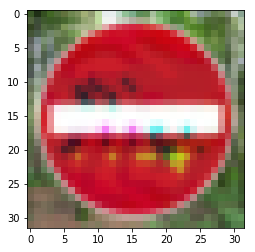

Sample: 1, Label: 1
Classified label: No entry  <------- Target: Dangerous curve to the right
30.0
['No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry']


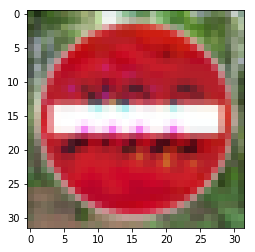

Sample: 1, Label: 2
Classified label: No entry  <------- Target: End of no passing by vechiles over 3.5 metric tons
30.0
['No entry', 'No entry', 'Road work', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry']


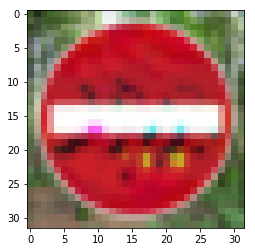

Sample: 1, Label: 3
Classified label: No entry  <------- Target: Keep right
30.0
['No entry', 'Speed limit (20km/h)', 'Slippery road', 'No entry', 'Yield', 'Yield', 'No entry', 'Road work', 'No entry', 'No entry']


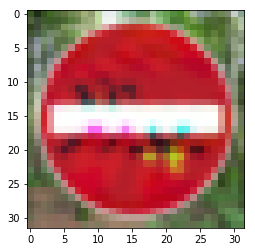

Sample: 1, Label: 4
Classified label: Yield  <------- Target: Speed limit (30km/h)
30.0
['No entry', 'Yield', 'No entry', 'No entry', 'Yield', 'Stop', 'No entry', 'No entry', 'Yield', 'No entry']


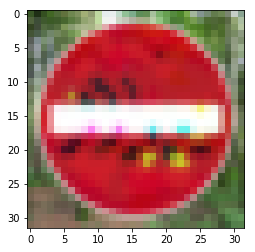

Sample: 1, Label: 5
Classified label: Bumpy road  <------- Target: Bumpy road
30.0
['No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'Stop', 'No entry', 'No entry', 'No entry']


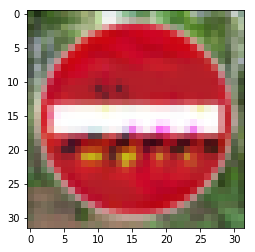

Sample: 1, Label: 6
Classified label: No entry  <------- Target: Road narrows on the right
30.0
['Yield', 'No entry', 'Road work', 'Road work', 'Bumpy road', 'Road work', 'Stop', 'No entry', 'No entry', 'No entry']


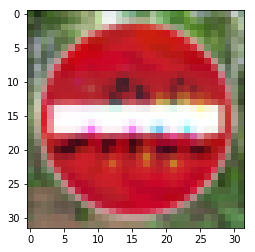

Sample: 1, Label: 7
Classified label: No entry  <------- Target: End of speed limit (80km/h)
30.0
['No entry', 'No entry', 'No entry', 'Road work', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry']


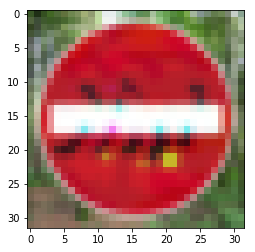

Sample: 1, Label: 8
Classified label: Yield  <------- Target: Yield
30.0
['Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'No entry', 'Yield']


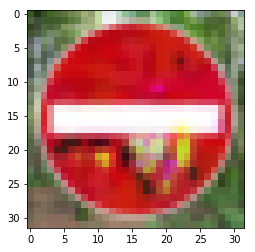

Sample: 1, Label: 9
Classified label: Yield  <------- Target: Speed limit (120km/h)
30.0
['Stop', 'No entry', 'No entry', 'No entry', 'Yield', 'Speed limit (20km/h)', 'Stop', 'No entry', 'No entry', 'Yield']


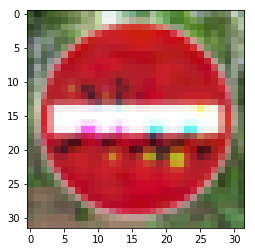

Sample: 1, Label: 10
Classified label: No entry  <------- Target: Bicycles crossing
30.0
['No entry', 'Stop', 'No entry', 'Road work', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry']


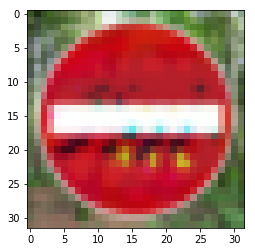

Sample: 1, Label: 11
Classified label: Stop  <------- Target: Stop
30.0
['Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop']


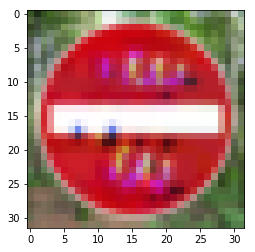

Sample: 1, Label: 12
Classified label: No entry  <------- Target: End of no passing
30.0
['No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'Road work']


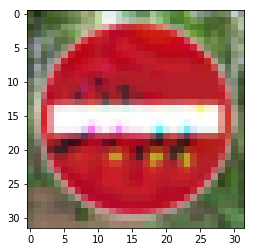

Sample: 1, Label: 13
Classified label: No entry  <------- Target: Go straight or left
30.0
['No entry', 'No entry', 'No entry', 'No entry', 'Bumpy road', 'No entry', 'No entry', 'No entry', 'Road work', 'Yield']


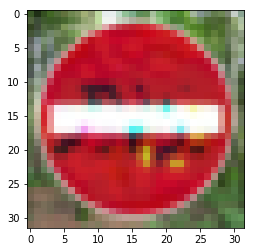

Sample: 1, Label: 14
Classified label: Yield  <------- Target: Speed limit (100km/h)
30.0
['Yield', 'No entry', 'No entry', 'No entry', 'No entry', 'Yield', 'No entry', 'No entry', 'No entry', 'Yield']


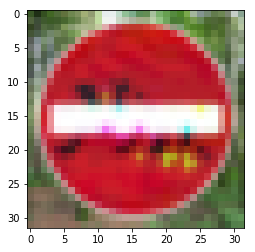

Sample: 1, Label: 15
Classified label: No entry  <------- Target: End of all speed and passing limits
30.0
['No entry', 'No entry', 'No entry', 'Yield', 'Stop', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry']


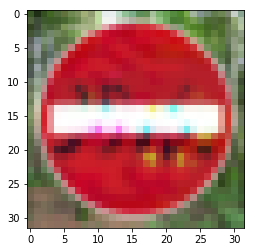

Sample: 1, Label: 16
Classified label: No entry  <------- Target: Dangerous curve to the left
30.0
['No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'Yield', 'No entry', 'No entry', 'No entry', 'No entry']


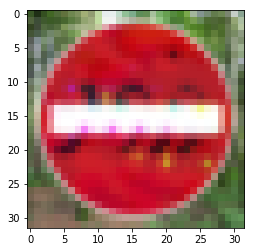

Sample: 1, Label: 17
Classified label: Double curve  <------- Target: Double curve
30.0
['No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'Double curve', 'No entry', 'No entry', 'No entry', 'No entry']


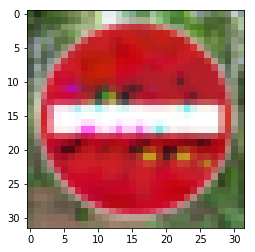

Sample: 1, Label: 18
Classified label: No entry  <------- Target: No passing
30.0
['No entry', 'No passing', 'Stop', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'Stop']


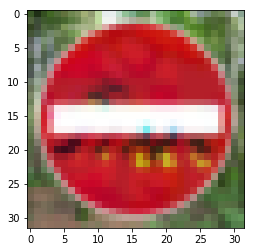

Sample: 1, Label: 19
Classified label: No entry  <------- Target: Traffic signals
30.0
['No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry', 'No entry']


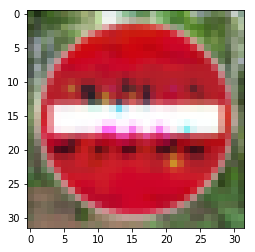

In [55]:
# Test and pick ones that work well here before printing

for i, o in enumerate(outputs_full[:2]):
    j = 0
    for _, x in enumerate(o):
        if np.argmax(y_smp[i]) == np.argmax(y_target[j]):
            j += 1
        print("Sample: " + str(i) + ", Label: " + str(j))
        resized_im = resize(x, (32, 32), interp="bilinear")
        print("Classified label: " + signnames[predict(model, resized_im)] + "  <------- Target: " 
              + signnames[np.argmax(y_target[j])])
        print(norms[i])
        test_tran(x, model)
        plt.imshow(resized_im)
        plt.show()
        j += 1

---
## Logo Attack

In [90]:
SAVE_DIR = "./adv_signs/Logo_Attacks/"
SAMPLE_IMG_DIR = './images/Logo_samples/'
SAMPLE_LABEL = None
N_ADV = 20
batch_size = 128

# Target classes are chosen at random
y_target = np.array([3, 20, 42, 38,  1, 22, 24,  6, 13,  8, 29, 14, 41, 37,  7,
                     32, 19, 21,  9, 26])
y_target = keras.utils.to_categorical(y_target, NUM_LABELS)

# Load sample images and labels
del_id = [4]
x_smp, x_smp_full, masks, masks_full = load_samples(
    SAMPLE_IMG_DIR, SAMPLE_LABEL)
x_smp = np.delete(x_smp, del_id, axis=0)
x_smp_full = np.delete(x_smp_full, del_id, axis=0)
masks = np.delete(masks, del_id, axis=0)
masks_full = np.delete(masks_full, del_id, axis=0)

# Get random sampling sizes
sp_size = np.repeat(np.random.randint(
    20, 600, batch_size), 2).reshape(batch_size, 2)

In [ ]:
# Main function
opt = OptProjTran(model, c=3, lr=0.02, target=True, use_bound=False,
                  init_scl=0.1, loss_op=0, var_change=False, use_mask=False,
                  k=100, batch_size=batch_size, decay=False, p_norm="1",
                  l=30, sp_size=sp_size, rnd_tran=INT_TRN,
                  rnd_bri=DELTA_BRI, c_smooth=0)

outputs = []
norms = []

for i, x in enumerate(x_smp):
    for j in range(N_ADV):
        print("sample {} - label {}".format(i, j))
        x_adv, norm = opt.optimize(
            x, y_target[j], n_step=2000, prog=True, mask=masks[i])
        outputs.append(x_adv)
        norms.append(norm)
        
    # Save outputs in pickle format
    pickle.dump(outputs, open("{}outputs_{}.p".format(
        SAVE_DIR, i), "wb"))
    pickle.dump(norms, open("{}norms_{}.p".format(
        SAVE_DIR, i), "wb"))
    outputs = []
    norms = []

Load and evaluate

In [91]:
outputs = []
norms = []
for i in range(len(x_smp)):
    outputs.append(pickle.load(open("{}outputs_{}.p".format(
        SAVE_DIR, i), "rb")))
    norms.extend(pickle.load(open("{}norms_{}.p".format(
        SAVE_DIR, i), "rb")))

In [92]:
x_adv = np.zeros((len(x_smp) * len(y_target),) + IMG_SHAPE)
for i, o in enumerate(outputs):
    for j, x in enumerate(o):
        x_adv[i * N_ADV + j] = x
        
y_tile = np.tile(y_target, (len(x_smp), 1))
x_rep = np.repeat(x_smp, len(y_target), axis=0)
x_rep_full = np.repeat(x_smp_full, len(y_target), axis=0)

In [93]:
suc_rate, c_adv, c_orig = evaluate_adv(model, x_adv, y_tile, x_rep, y_smp=None, 
                                       target=True, x_smp_full=x_rep_full, tran=False)

---
## Custom Sign Attack

In [78]:
SAVE_DIR = "./adv_signs/Custom_Sign_Attacks/"
SAMPLE_IMG_DIR = './images/Custom_Sign_samples/blank_signs/'
SAMPLE_LABEL = None
MASK_DIR = './images/Custom_Sign_samples/masks/'
N_ADV = 10
batch_size = 128

# Load sample images and labels
del_id = [1, 2, 4, 5]
x_smp, x_smp_full, _, _ = load_samples(
    SAMPLE_IMG_DIR, SAMPLE_LABEL)
x_smp = np.delete(x_smp, del_id, axis=0)
x_smp_full = np.delete(x_smp_full, del_id, axis=0)

# Target classes are chosen at random
y_target = np.array([1, 8, 12, 14, 41, 17, 7, 33, 37, 35])
y_target = keras.utils.to_categorical(y_target, NUM_LABELS)

# Load mask files and resize
masks = read_images(MASK_DIR, resize=True, interp='nearest')
masks = (masks > 0.5)[:, :, :, 0].astype(np.float32)
masks = np.delete(masks, [2, 4], axis=0)

# Get random sampling sizes
sp_size = np.repeat(np.random.randint(
    20, 600, batch_size), 2).reshape(batch_size, 2)

In [ ]:
opt = OptProjTran(model, c=1e4, lr=0.02, target=True, use_bound=False,
                  init_scl=0.5, loss_op=0, var_change=True, use_mask=True,
                  k=100, batch_size=batch_size, decay=False, p_norm="1",
                  l=1e4, sp_size=sp_size, rnd_tran=INT_TRN,
                  rnd_bri=DELTA_BRI, c_smooth=0)

outputs = []
norms = []

for i, x in enumerate(x_smp):
    for j, mask in enumerate(masks):
        for k in range(N_ADV):
            print("sample {} - mask {} - label {}".format(i, j, k))
            x_adv, norm = opt.optimize(
                x, y_target[k], n_step=2000, prog=True, mask=mask)
            outputs.append(x_adv)
            norms.append(norm)
            
    # Save outputs in pickle format
    pickle.dump(outputs, open("{}outputs_{}.p".format(
        SAVE_DIR, i), "wb"))
    pickle.dump(norms, open("{}norms_{}.p".format(
        SAVE_DIR, i), "wb"))
    outputs = []
    norms = []

Load and evaluate

In [82]:
outputs = []
for i in range(len(x_smp)):
    outputs.append(pickle.load(open("{}outputs_{}.p".format(
        SAVE_DIR, i), "rb")))

In [83]:
x_adv = np.zeros((len(x_smp) * len(y_target) * len(masks),) + IMG_SHAPE)
for i, o in enumerate(outputs):
    for j, x in enumerate(o):
        x_adv[i * len(y_target) * len(masks) + j] = x
        
y_tile = np.tile(y_target, (len(x_smp) * len(masks), 1))
x_rep = np.repeat(x_smp, len(y_target) * len(masks), axis=0)
x_rep_full = np.repeat(x_smp_full, len(y_target) * len(masks), axis=0)

In [84]:
suc_rate, c_adv, c_orig = evaluate_adv(model, x_adv, y_tile, x_rep, y_smp=None, 
                                       target=True, x_smp_full=x_rep_full, tran=False)

---
## Test Physical Attacks

The code below contains all functions that implement the traffic sign recognition pipeline (the classifier must be loaded previously as `model`). Note that the detector only detects circular traffic signs as it uses Circle Hough Transform. 

In [16]:
def detect_draw(model, im, gt=None):
    """
    Run detection on single image and draw bounding boxes, labels, and
    confidence scores
    """

    img = np.copy(im)
    bboxes = find_circles(img, mg_ratio=0.4, n_circles=3)
    for bbox in bboxes:
        crop = crop_bb(im, bbox)
        resized_im = resize(crop)
        label = signnames[predict(model, resized_im)]
        conf = np.max(softmax(model.predict(
            resized_im.reshape(INPUT_SHAPE))[0]))
        # Consider detection only if confidence is larger than threshold
        if conf > CONF_THRES:
            img = draw_bb(img, bbox)
            # Put label and confidence
            cv2.putText(img, '{}: {:.2f}'.format(label, conf), (bbox[0], bbox[1] - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 1, 0), 2)
        else:
            print('{}: {:.2f}'.format(label, conf))

    # Draw ground truth
    if gt is not None:
        for bb in gt:
            img = draw_bb(img, bb, color=(0, 0, 1))
            cv2.putText(img, signnames[bb[4]], (bb[0], bb[1] - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 1), 2)

    plt.figure(figsize=(16, 9))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [14]:
TARGET_DIR = "./input_data/FullIJCNN2013/"

gt_bboxes = read_bb(TARGET_DIR + "gt.txt")
images = read_images(TARGET_DIR)

End of no passing: 0.11
Roundabout mandatory: 0.22
Road work: 0.08


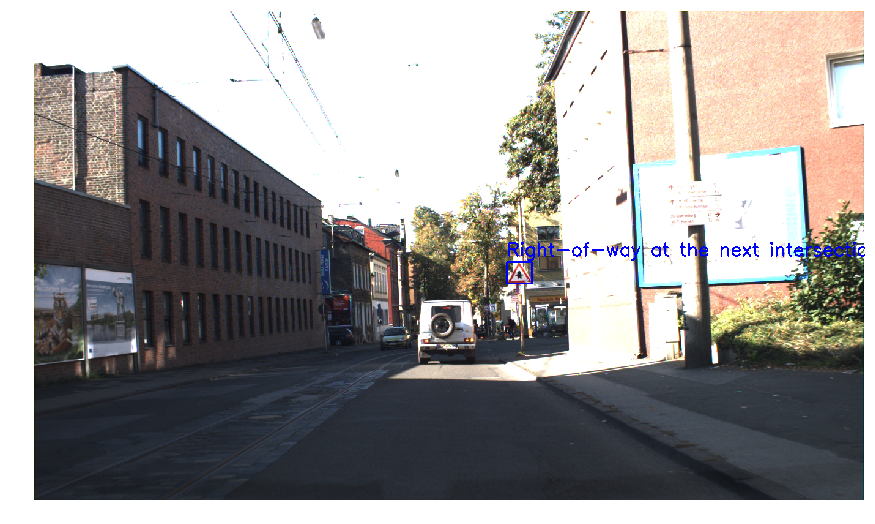

End of no passing by vechiles over 3.5 metric tons: 0.50


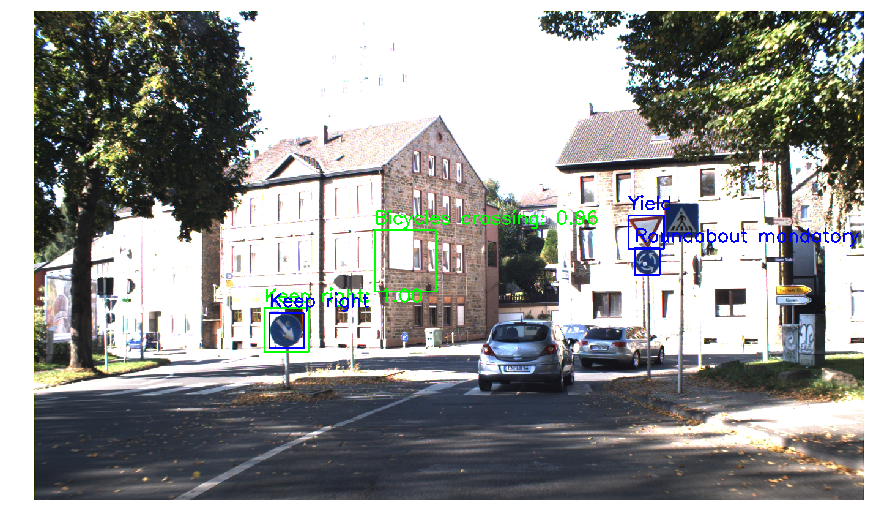

Road work: 0.14
Speed limit (60km/h): 0.07


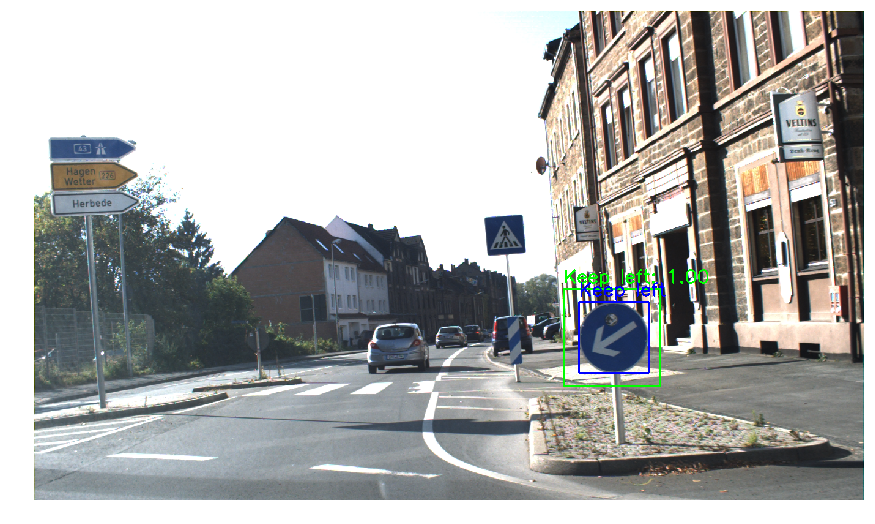

Yield: 0.09
Yield: 0.11
Roundabout mandatory: 0.38


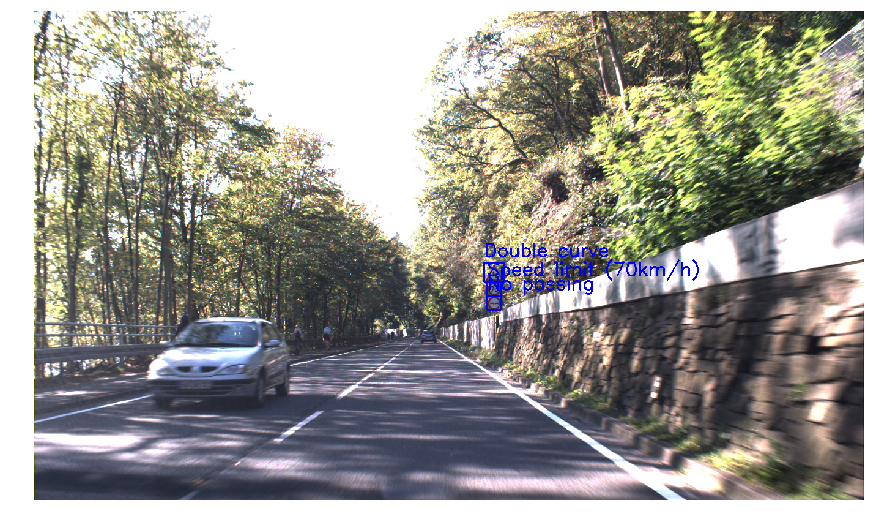

Dangerous curve to the left: 0.13
Roundabout mandatory: 0.07
Yield: 0.10


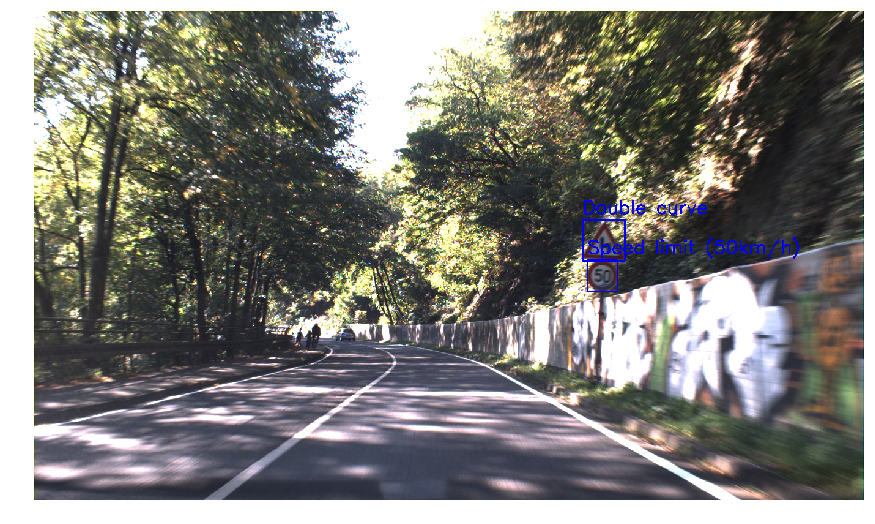

Roundabout mandatory: 0.85
Yield: 0.10
Speed limit (50km/h): 0.09


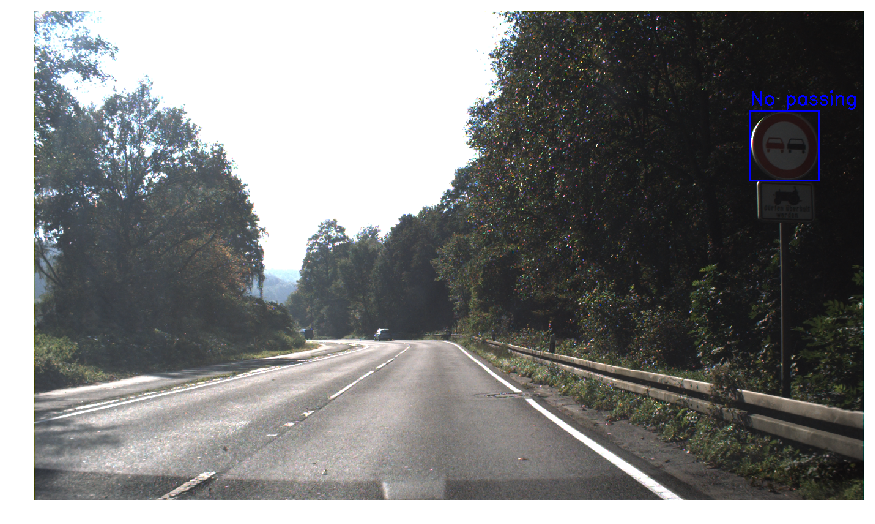

End of no passing: 0.18
Roundabout mandatory: 0.10
Speed limit (80km/h): 0.09


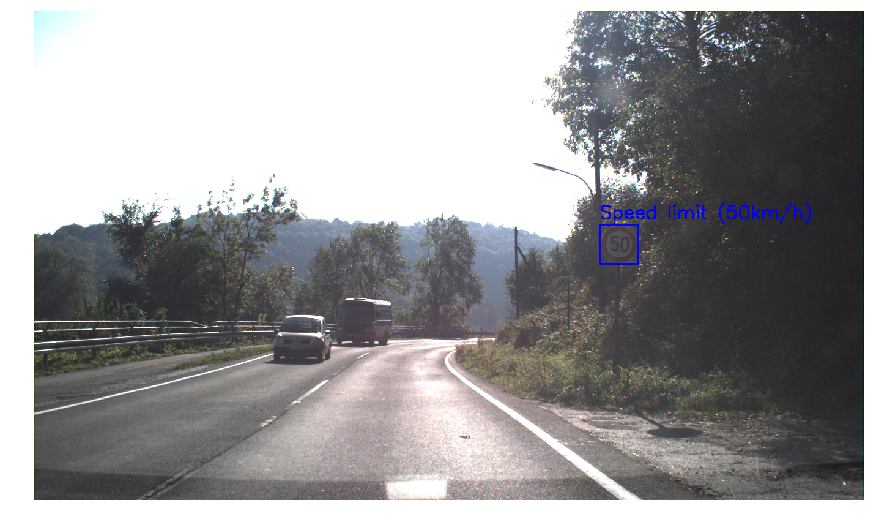

Children crossing: 0.09
Yield: 0.17
Yield: 0.26


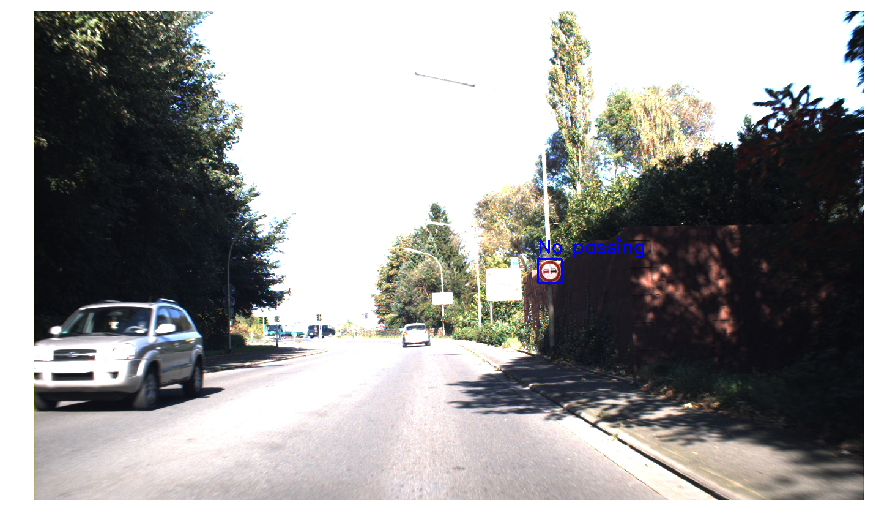

Speed limit (50km/h): 0.07
Yield: 0.09
Yield: 0.12


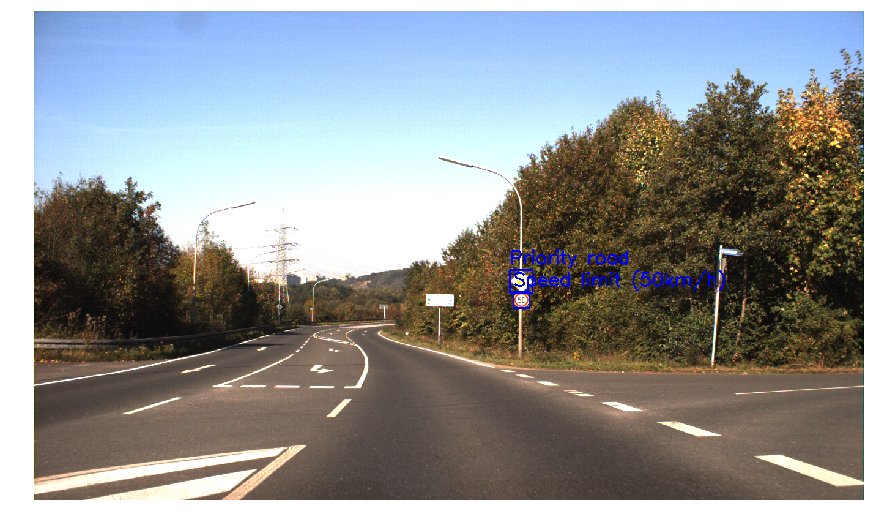

Yield: 0.10
Yield: 0.34
Speed limit (60km/h): 0.18


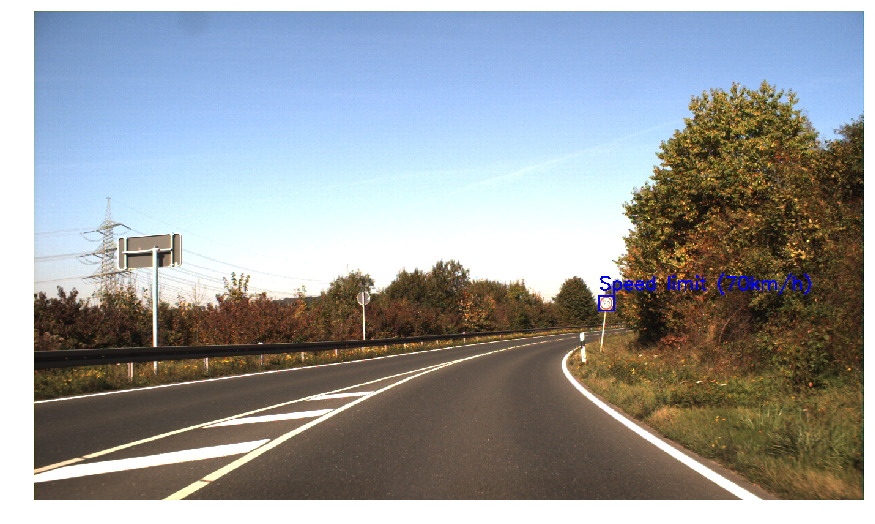

In [17]:
# Code snippet for drawing bounding boxes
for i, im in enumerate(images[:10]):
    if str(i) in gt_bboxes:
        detect_draw(model, im, gt_bboxes[str(i)])

In [ ]:
# Code snippet for evaluating detector
n_tp, n_pos = detect_mAP(model, images, gt_bboxes)
mAP = 0
for c in cir_cls:
    if n_pos[c] != 0:
        mAP += n_tp[c] / float(n_pos[c])
mAP = mAP / len(cir_cls)
print(mAP)

In [19]:
# Code snippet for evaluating our drive-by tests
# Include some sample video frames directly extracted from
# the video captured by GoPro camera without any preprocessing

# Adversarial Traffic Sign
TARGET_LABEL = 1
VIDEO_DIR = "./physical_adv/splim120_splim30_1/"

# Logo Attack
# TARGET_LABEL = 9
# VIDEO_DIR = "./physical_adv/star_nopass_1/"

# Custom Sign Attack
# TARGET_LABEL = 14
# VIDEO_DIR = "./physical_adv/orange_hello_stop_1/"

images = read_images(VIDEO_DIR)
n_tg = 0
n_det = 0
for im in images:
    bboxes = detect(model, im)
    if len(bboxes) == 0:
        continue
    n_det += 1
    for bb in bboxes:
        if bb[4] == TARGET_LABEL:
            n_tg += 1
            break
print(float(n_tg) / n_det)        
print(float(n_det) / len(images))

0.5084745762711864
0.4154929577464789


---
## Miscellaneous

### Test physical samples without detection

(deprecated)
Feed in manually cropped images

In [ ]:
test = read_images("./test_attack_1/test_2")

/home/chawins/.conda/envs/tsa3/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  
/home/chawins/.conda/envs/tsa3/lib/python3.6/site-packages/ipykernel_launcher.py:35: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


Speed limit (60km/h)
['Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Bumpy road', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)']


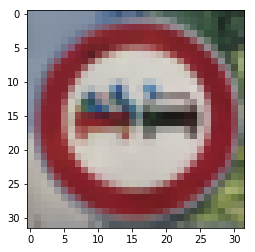

Speed limit (60km/h)
['Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Speed limit (60km/h)', 'Vechiles over 3.5 metric tons prohibited', 'Speed limit (60km/h)', 'Speed limit (60km/h)']


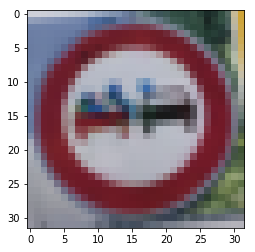

No passing
['No passing', 'No passing', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'Vechiles over 3.5 metric tons prohibited', 'No passing', 'No passing', 'Speed limit (60km/h)', 'No passing']


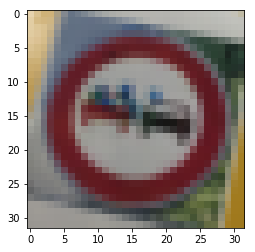

Turn right ahead
['Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead']


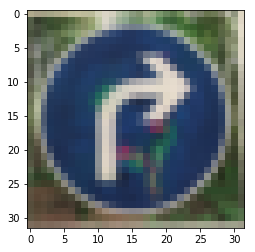

Turn right ahead
['Turn right ahead', 'Roundabout mandatory', 'Turn right ahead', 'Turn right ahead', 'Roundabout mandatory', 'Turn right ahead', 'Turn right ahead', 'Go straight or right', 'Turn right ahead', 'Turn right ahead']


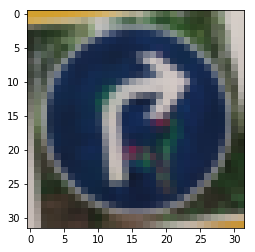

Turn right ahead
['Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Turn right ahead', 'Roundabout mandatory', 'Turn right ahead', 'Turn right ahead', 'Roundabout mandatory', 'Turn right ahead', 'End of no passing']


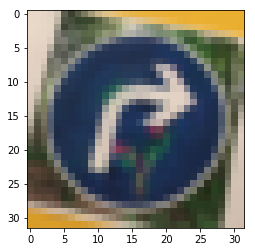

Speed limit (30km/h)
['Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)']


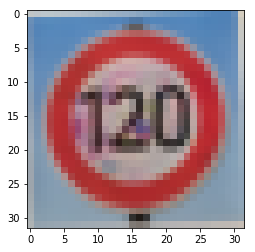

Speed limit (30km/h)
['Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)']


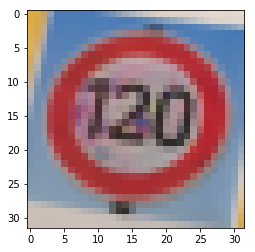

Speed limit (30km/h)
['Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (20km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)', 'Speed limit (30km/h)']


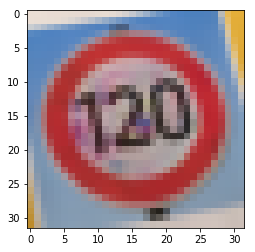

Yield
['Yield', 'Yield', 'Yield', 'Yield', 'Yield', 'End of no passing', 'Yield', 'Yield', 'Yield', 'Yield']


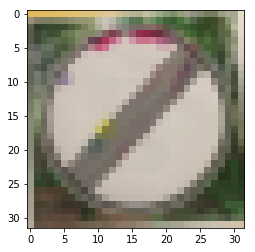

End of no passing
['End of no passing', 'End of no passing', 'End of no passing', 'Yield', 'End of no passing', 'End of no passing', 'End of no passing', 'End of no passing', 'End of no passing', 'End of no passing']


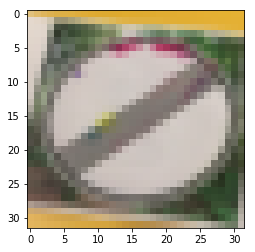

End of no passing
['End of no passing', 'End of no passing', 'End of all speed and passing limits', 'End of no passing', 'End of no passing', 'End of no passing', 'Yield', 'End of no passing', 'End of no passing', 'End of no passing']


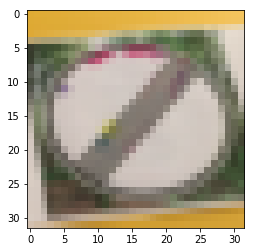

Stop
['Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop', 'Stop']


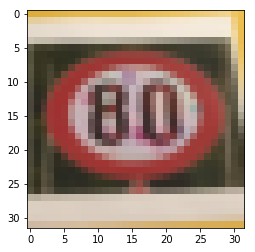

In [89]:
for i, im in enumerate(test):
    resized_im = resize(im, (32, 32), interp="bilinear")
    print(signnames[predict(model, resized_im)])
    test_tran(im, model)
    plt.imshow(resized_im)
    plt.show()

---
### Code to prepare original image

- Put background behind the schematic of a sign
(can also be done in other software like Inkscape)

In [33]:
def prepare_drawing(im, bg):
    
    pad = int(im.shape[0] / 10)
    hpad = int(pad / 2)
    height = im.shape[0] + pad
    width = im.shape[1] + pad
    new_im = np.zeros(shape=(height, width, im.shape[2]))
    new_im[hpad:height - hpad, hpad:width - hpad, :] = im
    
    mask = np.zeros(shape=(height, width, 1)) + 1
    mask[np.nonzero(new_im[:, :, 0])] = 0
    mask[200:500, 150:520, :] = 0
    
    bg = resize(bg, new_im.shape) / 255.
    new_im = new_im + mask * bg
    
    return new_im

In [44]:
im = read_image("./stop.png") / 255.
bg = read_image('./background.jpg') / 255.
tmp = prepare_drawing(im, bg)

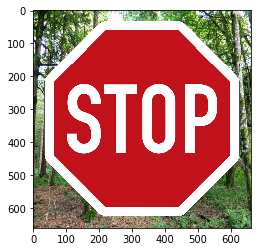

In [46]:
plt.imshow(tmp)
misc.imsave('test.png', tmp)

---
### Model trainer

In [11]:
# Build model
# model = built_mltscl()
model = build_cnn()

# Load dataset
x_train, y_train, x_val, y_val, x_test, y_test = load_dataset_GTSRB(
    n_channel=N_CHANNEL, train_file_name='train_extended_75.p')

y_train = keras.utils.to_categorical(y_train, NUM_LABELS)
y_test = keras.utils.to_categorical(y_test, NUM_LABELS)
y_val = keras.utils.to_categorical(y_val, NUM_LABELS)

In [13]:
filepath = './weights.{epoch:02d}-{val_loss:.2f}.hdf5'
modelCheckpoint = keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss', verbose=0,
                                                  save_best_only=False, save_weights_only=False,
                                                  mode='auto', period=1)
earlyStop = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5,
                                          verbose=0, mode='auto')

In [ ]:
model.fit(x_train, y_train, batch_size=BATCH_SIZE, epochs=NUM_EPOCH, verbose=1, 
          callbacks=[modelCheckpoint, earlyStop], validation_data=(x_val, y_val), 
          shuffle=True, initial_epoch=0)